### <b>ПРОЕКТНАЯ РАБОТА</b>

<b>Рынок заведений общественного питания Москвы.<br>
Исследование для стартапа.</b>

### <b>Описание проекта</b>

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.<br><p></p>
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.<br><p></p>
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.<br><p></p>
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Описание данных

Файл moscow_places.csv:<br>
name — название заведения;<br>
address — адрес заведения;<br>
category — категория заведения, например «кафе», «пиццерия» или «кофейня»;<br>
hours — информация о днях и часах работы;<br>
lat — широта географической точки, в которой находится заведение;<br>
lng — долгота географической точки, в которой находится заведение;<br>
rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);<br>
price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;<br>
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 - «Средний счёт: 1000–1500 ₽»;
 - «Цена чашки капучино: 130–220 ₽»;
 - «Цена бокала пива: 400–600 ₽».
и так далее;<br>

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:<br>
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 - 0 — заведение не является сетевым
 - 1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;<br>
seats — количество посадочных мест.

### Загрузка данных и изучение общей информации

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go
import folium
# импортируем карту и маркер
from folium import Map, Marker, Choropleth
# импортируем кластер
from folium.plugins import MarkerCluster
import json

In [2]:
mp = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
mp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
mp.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
mp['name'].nunique()

5614

In [5]:
mp['name'].duplicated

<bound method Series.duplicated of 0                     WoWфли
1             Четыре комнаты
2                      Хазри
3       Dormouse Coffee Shop
4                  Иль Марко
                ...         
8401              Суши Мания
8402               Миславнес
8403                 Самовар
8404            Чайхана Sabr
8405              Kebab Time
Name: name, Length: 8406, dtype: object>

В датафрейме представлены 8406 ресторанов. <br>
Количество уникальных названий - 5614. На практике, как правило, много ресторанов имеют филиалы с тем же названием в разных районах города. <br>
<p></p>
Типы данных соответствуют значениям в столбцах.<br>

 0   name               8406 non-null   object <br>
 1   category           8406 non-null   object <br>
 2   address            8406 non-null   object <br>
 3   district           8406 non-null   object <br>
 4   hours              7870 non-null   object <br>
 5   lat                8406 non-null   float64 -- <br>
 6   lng                8406 non-null   float64 -- <br>
 7   rating             8406 non-null   float64<br>
 8   price              3315 non-null   object <br>
 9   avg_bill           3816 non-null   object <br>
 10  middle_avg_bill    3149 non-null   float64<br>
 11  middle_coffee_cup  535 non-null    float64<br>
 12  chain              8406 non-null   int64  <br>
 13  seats              4795 non-null   float64<br>

In [6]:
# mp['lat'] = mp['lat'].astype(float)
# mp['lng'] = mp['lng'].astype(float)

### Предобработка данных

In [7]:
mp.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В таблице есть пропуски в столбцах Часы работы, Ценовая категория, Средний чек, Средний/средний чек, Средняя цена кофе, Количество мест.<br>

Пропуски оставим как есть, потому что было бы некорректно подгонять ценовую категорию под среднюю,  ведь каждый ресторан уникален. Многое зависит от кухни, от интерьера, от комфорта и т.п.

In [8]:
# проверка явных дубликатов в датасете
print(mp.duplicated().sum())
duplicated_df = mp[mp.duplicated()]
print(duplicated_df)

0
Empty DataFrame
Columns: [name, category, address, district, hours, lat, lng, rating, price, avg_bill, middle_avg_bill, middle_coffee_cup, chain, seats]
Index: []


In [9]:
# Код ревьюера

mp['name'] = mp['name'].str.lower()
mp['address'] = mp['address'].str.lower()

In [10]:
# Код ревьюера
mp[['name', 'address']].duplicated().sum()

4

In [11]:
# Код ревьюера
duplicates = mp[['name', 'address']]
duplicates[duplicates.duplicated(keep=False)]

,name,address
189,кафе,"москва, парк ангарские пруды"
215,кафе,"москва, парк ангарские пруды"
1430,more poke,"москва, волоколамское шоссе, 11, стр. 2"
1511,more poke,"москва, волоколамское шоссе, 11, стр. 2"
2211,раковарня клешни и хвосты,"москва, проспект мира, 118"
2420,раковарня клешни и хвосты,"москва, проспект мира, 118"
3091,хлеб да выпечка,"москва, ярцевская улица, 19"
3109,хлеб да выпечка,"москва, ярцевская улица, 19"


In [12]:
mp['name'] = mp['name'].str.strip()
mp['address'] = mp['address'].str.strip()

In [13]:
# Удаление дубликатов

mp[['name', 'address']].drop_duplicates()

,name,address
0,wowфли,"москва, улица дыбенко, 7/1"
1,четыре комнаты,"москва, улица дыбенко, 36, корп. 1"
2,хазри,"москва, клязьминская улица, 15"
3,dormouse coffee shop,"москва, улица маршала федоренко, 12"
4,иль марко,"москва, правобережная улица, 1б"
...,...,...
8401,суши мания,"москва, профсоюзная улица, 56"
8402,миславнес,"москва, пролетарский проспект, 19, корп. 1"
8403,самовар,"москва, люблинская улица, 112а, стр. 1"
8404,чайхана sabr,"москва, люблинская улица, 112а, стр. 1"


In [14]:
# проверка неявных дубликатов в датасете
duplicateRows = mp[mp.duplicated(['name', 'address', 'lat', 'lng'])]

display(duplicateRows)
print(duplicateRows.count())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


name                 1
category             1
address              1
district             1
hours                1
lat                  1
lng                  1
rating               1
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                1
seats                1
dtype: int64


In [15]:
mp[['name', 'address', 'lat', 'lng']].drop_duplicates()

,name,address,lat,lng
0,wowфли,"москва, улица дыбенко, 7/1",55.878494,37.478860
1,четыре комнаты,"москва, улица дыбенко, 36, корп. 1",55.875801,37.484479
2,хазри,"москва, клязьминская улица, 15",55.889146,37.525901
3,dormouse coffee shop,"москва, улица маршала федоренко, 12",55.881608,37.488860
4,иль марко,"москва, правобережная улица, 1б",55.881166,37.449357
...,...,...,...,...
8401,суши мания,"москва, профсоюзная улица, 56",55.670021,37.552480
8402,миславнес,"москва, пролетарский проспект, 19, корп. 1",55.640875,37.656553
8403,самовар,"москва, люблинская улица, 112а, стр. 1",55.648859,37.743219
8404,чайхана sabr,"москва, люблинская улица, 112а, стр. 1",55.648849,37.743222


#### Дополнительный столбец street с названиями улиц

In [16]:
# Создаем столбец 'street' с названиями улиц
#mp['street'] = mp['address'].str.split().str[1:].apply(' '.join)

mp['street'] = mp['address'].str.split(', ').str[1].str.strip()
mp

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица


In [17]:
#Код ревьюера
mp.query('street == "проспект Мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street


#### Столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно 24/7

In [18]:
# Создаем столбец is_24_7
mp['is_24_7'] = mp['hours'].str.contains('пн-вс 00:00-00:00|круглосуточно')
mp.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True
8405,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,россошанский проезд,True


Логическое значение True — если заведение работает ежедневно и круглосуточно;<br>
Логическое значение False — в противоположном случае.

### Анализ данных

#### Исследование по категориям заведений

Какие категории заведений представлены в данных? <br>
Исследуйте количество объектов общественного питания по категориям:<br> 
рестораны, кофейни, пиццерии, бары и так далее. <br>
Постройте визуализации.<br> 
Ответьте на вопрос о распределении заведений по категориям.<br>

In [19]:
# Какие категории заведений представлены в данных? 
print('В данных представлены следующие категории заведений:', mp['category'].unique());

В данных представлены следующие категории заведений: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [20]:
# количество объектов общественного питания по категориям: 
category = mp.groupby('category').agg({'address':'count'})
category = category.rename(columns={'address': 'count'})
category

,count
category,
"бар,паб",765
булочная,256
быстрое питание,603
кафе,2378
кофейня,1413
пиццерия,633
ресторан,2043
столовая,315


<Figure size 2000x1000 with 0 Axes>

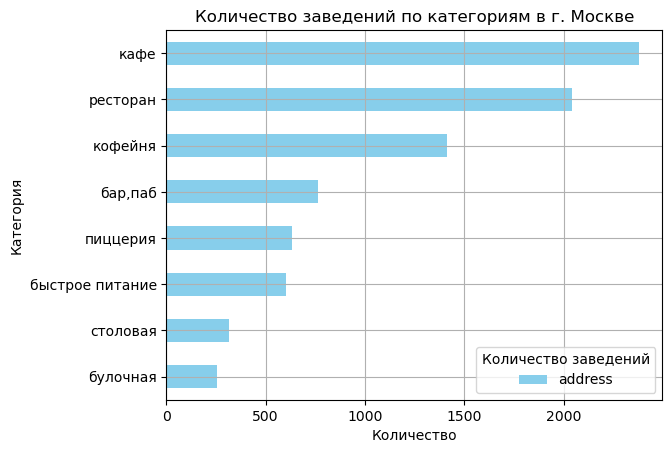

In [21]:
# Горизотальная ленточная сравнительная диаграмма
category = mp.groupby('category').agg({'address':'count'})
plt.figure(figsize=(20, 10))
ax = category.sort_values(by='address').plot(kind='barh', color='skyblue')
plt.title('Количество заведений по категориям в г. Москве')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.legend(title='Количество заведений')
plt.grid(True)
plt.show()

По графику видно, что больше всего в датасете заведений категории "кафе" и "ресторан". <br>
На третьем месте по количеству - кофейни.<br>
Фастфудов больше, чем столовых и булочных...

#### Посадочные места

Исследуйте количество посадочных мест в местах по категориям: <br>
рестораны, кофейни, пиццерии, бары и так далее. <br>
Постройте визуализации.<br>
Проанализируйте результаты и сделайте выводы.

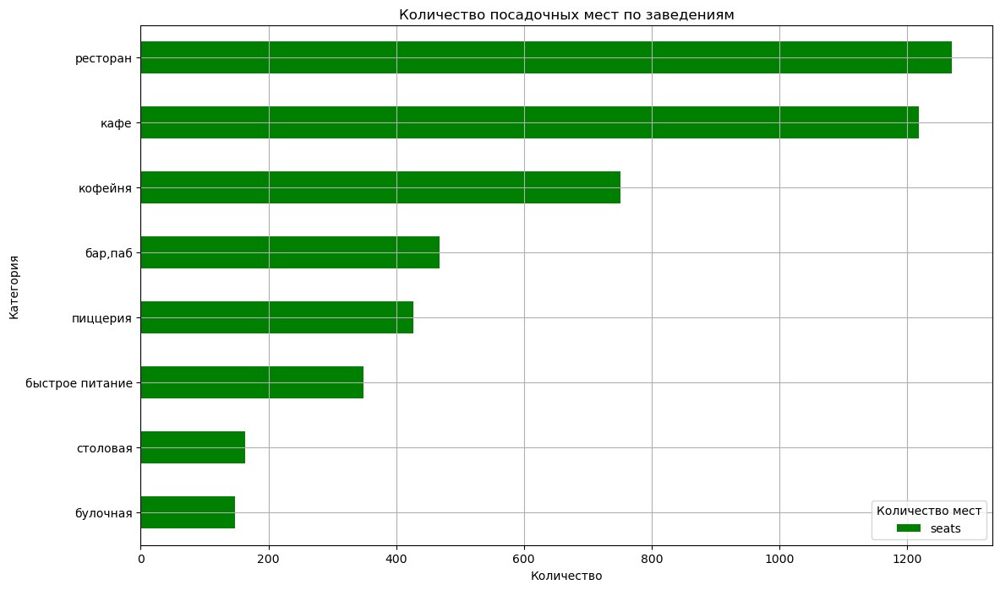

In [22]:
# Сравнительная диаграмма по посадочным местам
seats = mp.groupby('category').agg({'seats':'count'})
seats.sort_values('seats').plot(kind='barh', color='green', figsize=(13, 8))
plt.title('Количество посадочных мест по заведениям')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.legend(title='Количество мест')
plt.grid(True)
plt.show()

По посадочным местам, как и следовало ожидать, лидируют рестораны и кафе - там дольше всего времени посетители проводят время. <br>
Интересно, что таблица показывает в кофейнях больше мест, чем в пабах и барах - это, возможно, из-за пропусков в данных.

Пропуски в колонке по количеству мест в заведениях можно заменить медианным значением.

In [23]:
# # заменим пропуски в колонке количества мест на медианные значения и посмотрим обновленный график
# for n in mp['category'].unique():
#     mp.loc[(mp['category'] == n) & (mp['seats'].isna()), 'seats'] = \
#     mp.loc[(mp['category'] == n), 'seats'].median()
# mp.isna().sum()

In [24]:
# # Сравнительная диаграмма по посадочным местам после "заглушек"
# seats = mp.groupby('category').agg({'seats':'count'})
# seats.sort_values('seats').plot(kind='barh', color='green', figsize=(15, 8))
# plt.title('Количество посадочных мест по заведениям после заполнения пустых значений мест')
# plt.xlabel('Количество')
# plt.ylabel('Категория')
# plt.legend(title='Количество мест')
# plt.grid(True)
# plt.show()

Замена пропущенных значений в столбце количества мест не повлияла на сравнение мест по категориям

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Скажу больше. Заполнять пропуски можно только в случае MCAR без искажения статистических свойств данных. Если пропуски MAR или MNAR, выбор метода заполнения должен основываться на глубоком понимании природы данных и причин пропусков.

Таким образом, перед заполнением пропусков, важно определить, к какому типу они относятся и основывать свои действия на этом понимании. Если мы не уверены в характере пропусков, лучше оставить их незаполненными или использовать методы моделирования, устойчивые к пропускам данных. Обработка пропусков медианой в данном случае невозможна.
    
**Типы пропущенных данных:**
    
* MCAR (Missing Completely At Random): данные пропущены полностью случайно. В этом случае заполнение пропусков, скажем, медианным значением, не будет искажать распределение.

* MAR (Missing At Random): пропуск в переменной зависит от других наблюдаемых переменных, но не зависит от самой пропущенной переменной.

* MNAR (Missing Not At Random): пропуск в переменной зависит от самой пропущенной переменной.
</div>

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента</b> 
Спасибо за ликбез! 
</div>

Также, в кофейнях больше мест, чем в пабах и барах...

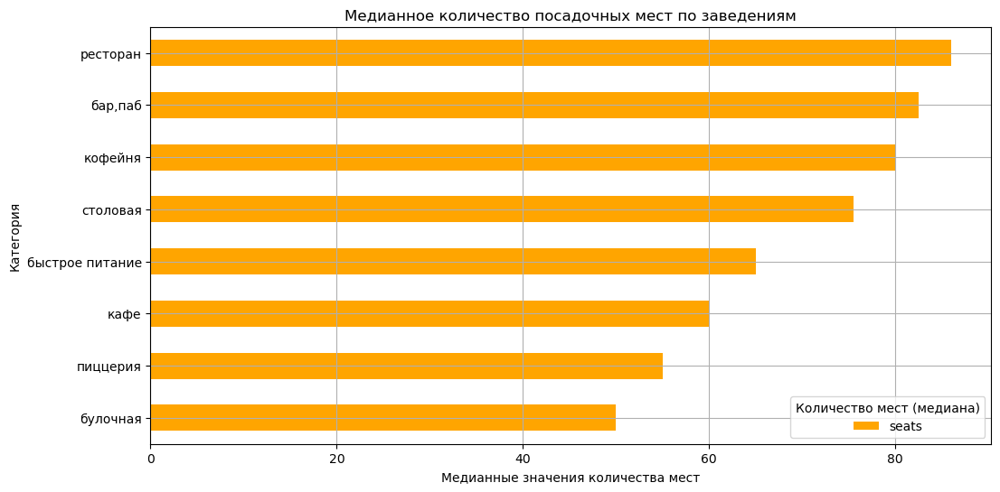

In [25]:
# Группировка данных по типам заведений
median_seats = mp.groupby('category').agg({'seats':'median'}).sort_values(by='seats')

# Сравнительный график
median_seats.sort_values('seats').plot(kind='barh', color='orange', figsize=(12, 6))
plt.title('Медианное количество посадочных мест по заведениям')
plt.xlabel('Медианные значения количества мест')
plt.ylabel('Категория')
plt.legend(title='Количество мест (медиана)')
plt.grid(True)
plt.show()

#### Сетевые и несетевые заведения

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [26]:
# Количество сетевых заведений
net = mp.loc[mp["chain"]==1, "name"].count()
print('Количество сетевых заведений:', net, 'единиц')

# Количество несетевых заведений
single = mp['chain'].count() - net
print('Количество несетевых заведений:', single, 'единиц')

Количество сетевых заведений: 3205 единиц
Количество несетевых заведений: 5201 единиц


In [27]:
# Соотношение сетевых и несетевых заведений в датасете
# Круговая диаграмма
rest_type = ['Сетевые', 'Несетевые']
net_single = [net, single]
colors = ['#FFF455', '#4CCD99']
fig = go.Figure(data=[go.Pie(labels=rest_type, values=net_single, title='Типы ресторанов', marker=dict(colors=colors))])
fig.show()

Несетевых и сетевых заведений 62% и 38% соответственно.

<b>Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.</b>

In [28]:
net_units = mp[(mp['chain'] == 1)]
#net_units
net_units = net_units.groupby('category').agg({'address':'count'}).sort_values(by='address', ascending=False)
net_units = net_units.rename(columns = {'address': 'count'})
net_units

,count
category,
кафе,779
ресторан,730
кофейня,720
пиццерия,330
быстрое питание,232
"бар,паб",169
булочная,157
столовая,88


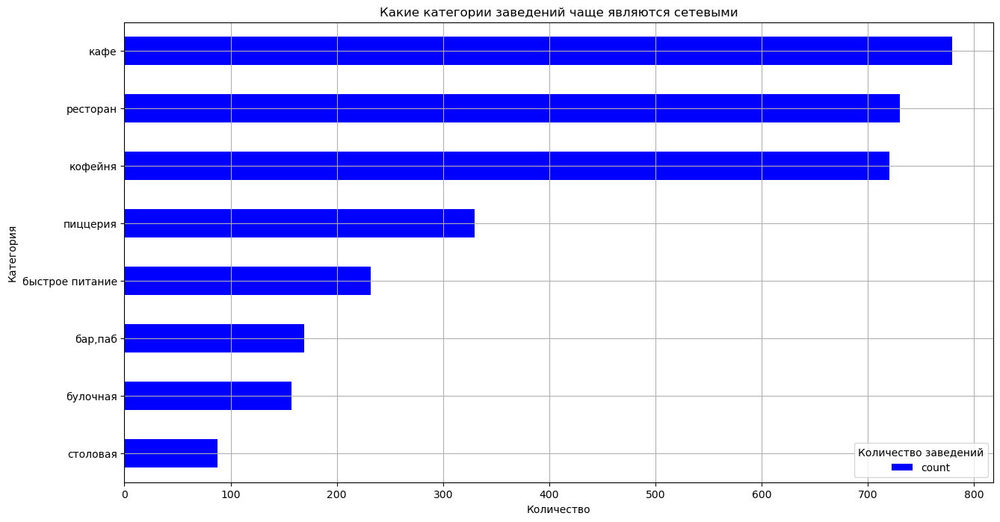

In [29]:
# Сравнительная диаграмма по категорям сетевых заведений
net_units.sort_values('count').plot(kind='barh', color='blue', figsize=(15, 8))
plt.title('Какие категории заведений чаще являются сетевыми')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.legend(title='Количество заведений')
plt.grid(True)
plt.show()

Такие категории заведений как Кафе, Ресторан и Кофейня, чаще являются сетевыми.<br>
Далее по убыванию идут Пиццерия, Быстрое питание и Бары/Пабы.

In [30]:
lab = net_units.index
val = net_units['count']
colors = ['#FFBE98', '#F7DED0']
fig = go.Figure(data=[go.Pie(labels=lab, values=val, title='Доли сетевых ресторанов', marker=dict(colors=colors))])
fig.show()

In [31]:
#Код ревьюера
chain = mp.groupby('category').agg({'chain':['count','sum']}).reset_index()
# считаем количество заведений по категориям и сколько из них сетевые

chain.columns = ['category','total_amnt','chain']
# переименовывем столбцы

chain['percent%'] = (chain['chain']/chain['total_amnt']*100).round(1)
# считаем долю сетевых от всех заведений в категориях, выводим на экран

chain = chain.sort_values(by='percent%',ascending=False)
display(chain.style.background_gradient(subset=['total_amnt','percent%'],cmap='Blues', axis=0))

order = list(chain['category'])
# список для сортировки графика

,category,total_amnt,chain,percent%
1,булочная,256,157,61.300000
5,пиццерия,633,330,52.100000
4,кофейня,1413,720,51.000000
2,быстрое питание,603,232,38.500000
6,ресторан,2043,730,35.700000
3,кафе,2378,779,32.800000
7,столовая,315,88,27.900000
0,"бар,паб",765,169,22.100000


In [32]:
# Создаем визуализацию для предыдущего кода
fig = go.Figure()

fig.add_trace(go.Bar(x=chain['category'], y=chain['total_amnt'], name='Total Amount', marker_color='skyblue'))
fig.add_trace(go.Bar(x=chain['category'], y=chain['chain'], name='Chain', marker_color='orange'))

for i, (category, chain_count, percent) in enumerate(zip(chain['category'], chain['chain'], chain['percent%'])):
    fig.add_annotation(x=category, y=chain_count,
                       text=f'{percent}%',
                       xref='x', yref='y',
                       showarrow=False,
                       font=dict(size=10))

fig.update_layout(title='Count of establishments by category',
                   xaxis_title='Category',
                   yaxis_title='Count',
                   xaxis_tickangle=-45)
fig.show()

#### Топ-15 популярных сетей.

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. <br>
    Под популярностью понимается количество заведений этой сети в регионе. <br>
    Постройте подходящую для такой информации визуализацию. <br>
    Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? <br>
    К какой категории заведений они относятся?

In [33]:
# # Топ-15 по рейтингу
# pd.set_option('display.max_colwidth', None)
# #rating = mp.groupby('rating').agg({'name':'unique'}).sort_values(by='rating', ascending=False)
# rating = mp.groupby('name').agg({'rating':'max'}).sort_values(by='rating', ascending=False)
# top_15 = rating.nlargest(15, 'rating')
# #rating
# print('\033[1m' + 'Топ-15 популярных заведений по рейтингу:' + '\033[0m')
# top_15

In [34]:
# Топ-15 по количеству
grouped = mp.groupby('name').size().reset_index(name='count')
# Найти топ-15 популярных сетей
top_15_net = grouped.nlargest(15, 'count')

print('\033[1m' + 'Топ-15 популярных заведений по количеству филиалов:' + '\033[0m')
print(top_15_net)

Топ-15 популярных заведений по количеству филиалов:
                                     name  count
2825                                 кафе    189
5418                          шоколадница    120
2532                       домино'с пицца     77
2500                           додо пицца     74
1137                     one price coffee     72
5491                         яндекс лавка     69
413                                 cofix     65
1263                                prime     50
4993                           хинкальная     44
5319                               шаурма     43
3178                             кофепорт     42
3236  кулинарная лавка братьев караваевых     39
4700                              теремок     38
5112                              чайхана     37
4172                             ресторан     34


In [35]:
# # данные для отображения на карте Топ-15 по количеству
# merged = top_15_net.merge(mp, on='name', how='left')

# print('Список Топ-15 заведений по количеству:')
# merged

In [36]:
# # Местоположение Топ-15 заведений на карте
# m = folium.Map(location=[55.7558, 37.6176], zoom_start=10)  # Центр Москвы

# def create_marker(row):
#     folium.Marker([row['lat'], row['lng']],
#         popup=f"{row.name}: {row['name']} ({row['count']})"
#     ).add_to(m)

# merged.apply(create_marker, axis=1)
# m

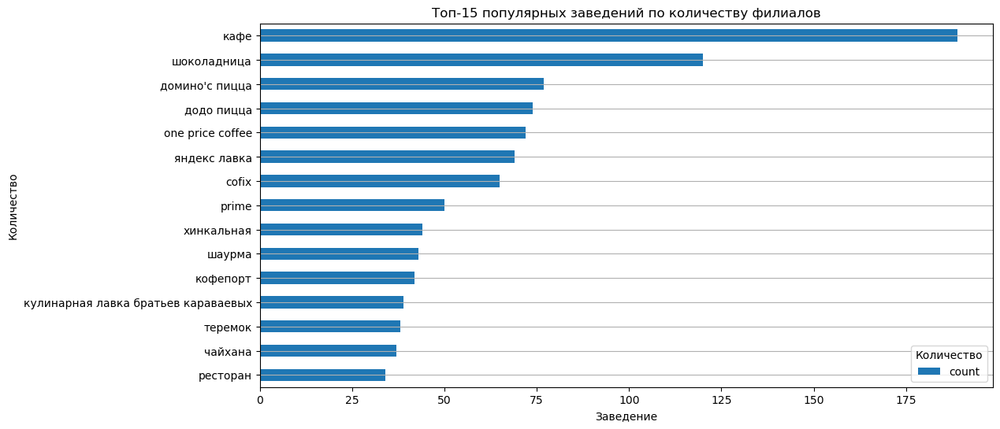

In [37]:
# Построение графика
top_15_net.sort_values(by='count', ascending=True).plot(kind='barh',  x='name', y='count', stacked=True, figsize=(12, 6))
plt.title('Топ-15 популярных заведений по количеству филиалов')
plt.xlabel('Заведение')
plt.grid(axis='y')
plt.ylabel('Количество')
plt.legend(title='Количество')
plt.show()

Топ-15 заведений относятся к разным категориям. Какого-то объединяющего признака не видно.<br>
Расположены по всем районам Москвы.<br>
<p></p>
К общему признаку, который их объединяет, можно отнести следующее:<br>
- большинство заведений предназначены для массового посещения, с детьми, со всей семьей, <br>
- цены в меню в таких заведениях обычно ниже, чем в ресторанах, пабах и барах, <br>
- меню в таких заведениях больше подходятдля тех, что кто хочет сытно покушать разных блюд.

#### Административные районы

Какие административные районы Москвы присутствуют в датасете? <br>
Отобразите общее количество заведений и количество заведений каждой категории по районам. <br>
Попробуйте проиллюстрировать эту информацию одним графиком.<p></p>
Визуализируйте распределение средних рейтингов по категориям заведений. <br>
Сильно ли различаются усреднённые рейтинги в разных типах общепита?

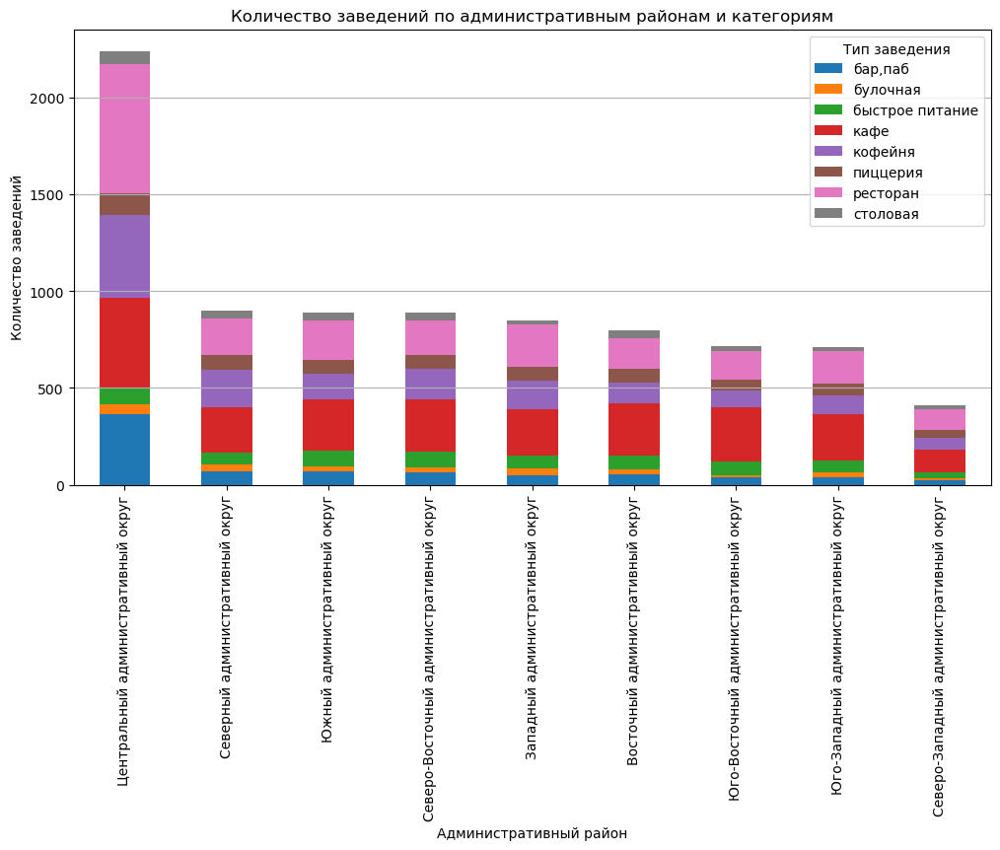

In [38]:
# Группировка данных по административным районам и типам заведений
district_counts = mp.groupby(['district', 'category']).size().unstack(fill_value=0)

# Сортировка по общему количеству заведений
district_counts_sorted = district_counts.sum(axis=1).sort_values(ascending=False)

# Переиндексация отсортированных данных
district_counts_sorted = district_counts.loc[district_counts_sorted.index]

# Построение графика
district_counts_sorted.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Количество заведений по административным районам и категориям')
plt.xlabel('Административный район')
plt.grid(axis='y')
plt.ylabel('Количество заведений')
plt.legend(title='Тип заведения')
plt.show()


In [39]:
# Добавление столбца с общим количеством заведений
district_counts_sorted['total'] = district_counts_sorted.sum(axis=1)
print('\033[1m' + 'Распределение количества заведений по административным округам Москвы и по категориям:' + '\033[0m')
district_counts_sorted

Распределение количества заведений по административным округам Москвы и по категориям:


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,235,193,77,189,41,900
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Западный административный округ,50,37,62,239,150,71,218,24,851
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента</b> 
По количеству заведений лидирует Центральный административный округ (больше 2 тыс). Меньше всего заведений в Северо-западном административном округе (меньше 500 ед.). В остальных округах Москвы от 700 до 900 заведений.</div>

Средние рейтинги по категориям заведений:


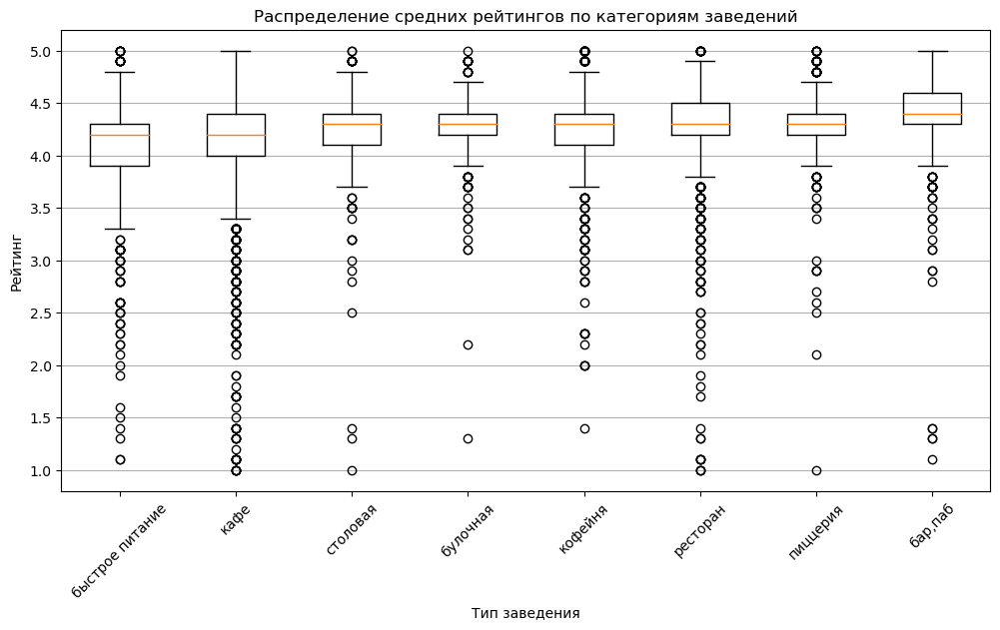

In [40]:
# Группировка данных по типам заведений и расчет средних рейтингов
mean_ratings = mp.groupby('category')['rating'].mean().sort_values()

print('\033[1m' + 'Средние рейтинги по категориям заведений:' + '\033[0m')

# Построение графика boxplot
plt.figure(figsize=(12, 6))
plt.boxplot([mp[mp['category']==type_]['rating'] for type_ in mean_ratings.index], labels=mean_ratings.index)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.ylabel('Рейтинг')
plt.xlabel('Тип заведения')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Диаграма размаха показывает разные диапазоны средних рейтингов заведений.<br>
Кафе и Точки быстрого питания имеют сильный размах в рейтнгах от 3.3 до 5. <br>
Остальные категории находятся в диапазоне от 3.5 до 5.<br>
По всем категориям есть выбросы в распределении рейтингов.

#### Фоновая картограмма (хороплет)

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.<br>
Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.<br>
Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [41]:
rating_df = mp.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [42]:
# импортируем карту и хороплет
#from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
ch_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(ch_rating)

ch_rating

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента</b> 

Фоновая картограмма (хороплет) показывает что в ЦАО находятся больше всего заведений со средним высоким рейтингом. В районах СВАО и ЮВАО заведения, где больше заведений с низким средним рейтингом. В остальных районах рейтинг примерно на одном уровне.
</div>

#### Кластеры

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
cluster_all = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(cluster_all)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
mp.apply(create_clusters, axis=1)

# выводим карту
cluster_all

#### Топ-15 улиц по количеству заведений

Найдите топ-15 улиц по количеству заведений. <br>
Постройте график распределения количества заведений и их категорий по этим улицам.<br>
Попробуйте проиллюстрировать эту информацию одним графиком.<br>
Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

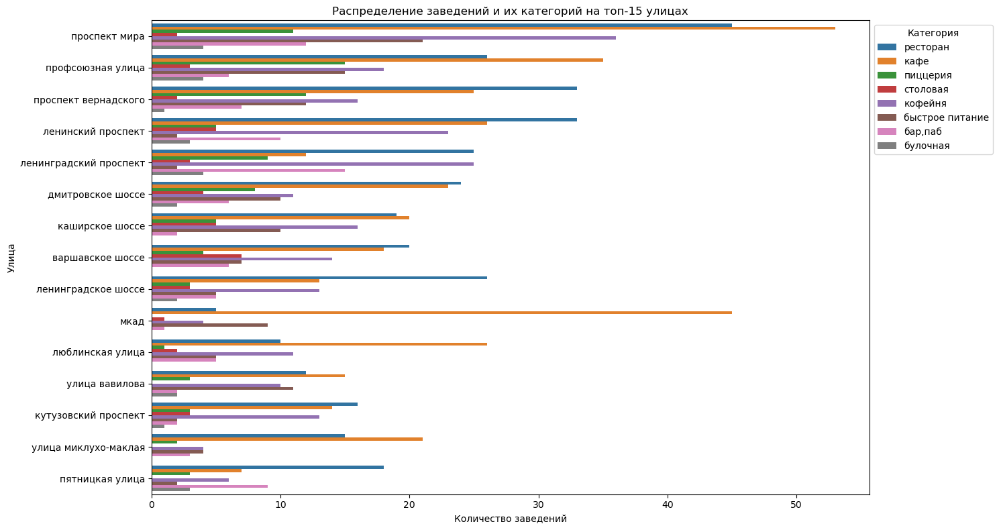

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# Находим топ-15 улиц по количеству заведений
top_streets = mp['street'].value_counts().head(15).index.tolist()

# Фильтруем данные по топ-15 улицам
top_streets_data = mp[mp['street'].isin(top_streets)]

# Создаем график
plt.figure(figsize=(15, 8))
sns.countplot(y='street', hue='category', data=top_streets_data, order=top_streets)
plt.title('Распределение заведений и их категорий на топ-15 улицах')
plt.xlabel('Количество заведений')
plt.ylabel('Улица')
plt.legend(title='Категория', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

In [45]:
# Группировка данных по административным районам и типам заведений
street_list = mp.groupby(['street', 'category']).size().unstack(fill_value=0)

# Сортировка по общему количеству заведений
street_list_sorted = street_list.sum(axis=1).sort_values(ascending=False)

# Переиндексация отсортированных данных
street_list_sorted = street_list.loc[street_list_sorted.index]

# # Добавление столбца с общим количеством заведений
street_list_sorted['total'] = street_list_sorted.sum(axis=1)
print('\033[1m' + 'Топ-15 улиц по количеству заведений:' + '\033[0m')

display(street_list_sorted.head(15))

Топ-15 улиц по количеству заведений:


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект мира,12,4,21,53,36,11,45,2,184
профсоюзная улица,6,4,15,35,18,15,26,3,122
проспект вернадского,7,1,12,25,16,12,33,2,108
ленинский проспект,10,3,2,26,23,5,33,5,107
ленинградский проспект,15,4,2,12,25,9,25,3,95
дмитровское шоссе,6,2,10,23,11,8,24,4,88
каширское шоссе,2,0,10,20,16,5,19,5,77
варшавское шоссе,6,0,7,18,14,4,20,7,76
ленинградское шоссе,5,2,5,13,13,3,26,3,70


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента v.2</b> 
Анализ топ-15 улиц, показывает что на больших/длинных/широких проспектах и улицах, тянущихся от центра города, сконцентрировано большее количество заведений. Максимальное количество на проспекте Мира - 103 заведения, далее по убыванию на Ленинском и Ленинградском проспекте и т.д.
</div>

<b>-------------------------------------------------------------------------------------</b>

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [46]:
# Группировка данных по улицам и подсчет количества заведений на каждой улице
street_counts = mp['street'].value_counts()

# Выбор улиц, где количество заведений равно 1
streets_with_one_place = street_counts[street_counts == 1].index.tolist()

# Вывод улиц, где находится только один объект общепита
print("Улицы только с одним объектом общепита:")
for street in streets_with_one_place:
    print(street)


Улицы только с одним объектом общепита:
2-й рощинский проезд
улица стасовой
парк дружбы
улица губкина
улица ремизова
андреевский пешеходный мост
4-й воробьёвский проезд
улица фотиевой
4-й рощинский проезд
проезд донелайтиса
черёмушкинский проезд
талдомская улица
3-я фрунзенская улица
малая тульская улица
воробьёвская набережная
2-й верхний михайловский проезд
3-й михалковский переулок
городская улица
2-й лучевой просек
пр-т комсомольский
улица маршала баграмяна
прибрежный проезд
сумская
улица рокотова
улица айвазовского
улица кирпичные выемки
парк левобережный
угличская улица
проезд одоевского
новоясеневский тупик
улица паустовского
ландшафтный заказник лианозовский
1-й капотнинский проезд
липецкая улица (дублёр)
братеевский парк
2-й квартал капотни
парк борисовские пруды
парк имени артёма боровика
братиславский парк
2-й квартал капотня
лианозовский парк культуры и отдыха
ставропольский проезд
улица капотня
новгородская улица
парк алтуфьево
дендропарковая улица
1-я стекольная улица
лиа

In [47]:
unique_streets = set(streets_with_one_place)
num_unique_streets = len(unique_streets)
print(f"Количество улиц только с одним объектом общепита: {num_unique_streets}")

Количество улиц только с одним объектом общепита: 457


Что можно сказать об этих заведениях? <br>
Улицы с только одним объектом общепита могут иметь различные характеристики, в зависимости от конкретной улицы и района. Однако, можно предположить, что они могут быть менее популярными для открытия заведений общепита из-за меньшего потока клиентов или других особенностей окружающей инфраструктуры.

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента v.2:</b> 
Количество улиц только с одним объектом общепита - 457.
</div>

#### Средний чек

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [48]:
# Расчет медианы стоимости заказа для каждого района
median_avg_bill_by_district = mp.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)

print('\033[1m' + 'Значения средних чеков для каждого района:' + '\033[0m')
print(median_avg_bill_by_district)

Значения средних чеков для каждого района:
district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64


In [49]:
# импортируем карту и хороплет
#from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
cluster_median_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг среднего чека по районам',
).add_to(cluster_median_bill)

cluster_median_bill

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента v.2</b> 
В Центральном и Западном районах располагаются заведения с более догорим меню, по сравнению с остальными районами.<br>
Фактор центра всегда повышает престижность заведения, требования к качеству обслуживания и комфорности, плюс большая посещаемость туристами и гостями города.<br>
Также влияет расположение поблизости деловых центров, исторических мест, архитекутрных зданий. Богатая инфраструктура. Дороговизна жилья.<br>
В сторону северо-востока, юго-востока и юга от центра Москвы расположены заведения с более умеренными ценами. 
</div>

### Общий вывод

- Было проанализировано 8406 заведений общественого питания в г. Москве.
- В столбцах, содержащие цены на меню, средний чек и т.п. есть пропуски, которые мы не стали заменять на медианные или средние значения.
- Также данные были проверены на присутсвие дубликатов в датасете.
- В данных представлены 8 типов заведений: кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная, столовая.
- Больше всего в датасете заведений категории "кафе" и "ресторан", 2378 и 2043 единиц соответственно. На третьем месте по количеству - кофейни, 1413 заведений. Фастфудов больше, чем столовых и булочных.
- По посадочным местам, как и следовало ожидать, лидируют рестораны и кафе. После них идут кафени и бары.
- Количество сетевых заведений - 3205 единиц. Количество несетевых заведений - 5201 единиц. 38% и 62% соответственно.
- Чаще всего сетевыми заведениями по убыванию являются кафе, рестораны и кофейни с пиццериями.
- Также были выведены Топ-15 заведений по количеству филиалов.
- На карте города топ заведения расположены по всем районам.
- К общему признаку, который их объединяет, можно отнести следущее:<br>
    - большинство заведений предназначены для массового посещения, с детьми, со всей семьей, <br>
    - цены в меню в таких заведениях обычно ниже, чем в ресторанах, пабах и барах, <br>
    - меню в таких заведениях больше подходятдля тех, что кто хочет сытно покушать разных блюд.
- По количеству заведений лидирует Центральный административный округ (больше 2 тыс). Меньше всего заведений в Северо-западном административном округе (меньше 500 ед.). В остальных округах Москвы от 700 до 900 заведений.
- Пабы/бары и рестораны имеют больший средний рейтинг среди заведений. У точек быстрого питания самый низкий средний рейтинг.
- Фоновая картограмма (хороплет) показывает что в ЦАО находятся больше всего заведений со средним высоким рейтингом. В районах СВАО и ЮВАО заведения, где больше заведений с низким средним рейтингом. В остальных районах рейтинг примерно на одном уровне.
- Вывели из датасета таблицу с топ-15 улиц по количеству заведений. 
- По среднему чеку лидируют Западный административный округ (1000 руб), Центральный административный округ (1000 руб) и Северо-Западный административный округ (700 руб). Дешевле меню в заведениях Северо-Восточного (500 руб), Южного (500 руб) и Юго-Восточного административных округов (450 руб).

### Шаг 4. Детализируем исследование: открытие кофейни

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [50]:
# Подсчет количества кофеен
coffee_shop_count = (mp['category'] == 'кофейня').sum()

print("Количество кофеен в датасете:", coffee_shop_count)

Количество кофеен в датасете: 1413


In [51]:
# Отфильтровываем данные по категории 'кофейня'
coffee_shops = mp[mp['category'] == 'кофейня']

# Подсчет количества кофеен в каждом районе
coffee_shops_by_district = coffee_shops['district'].value_counts()

print("Количество кофеен по районам:")
print()
print(coffee_shops_by_district)

Количество кофеен по районам:

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: count, dtype: int64


In [52]:
df_coffee_shop = mp.loc[mp['category'] == 'кофейня']
df_coffee_shop

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,новохохловская улица,False


In [53]:
from folium.plugins import MarkerCluster
from folium import Map, Marker

# Specify the center coordinates of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# Create a map of Moscow
cluster_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# Create an empty MarkerCluster and add it to the map
marker_cluster = MarkerCluster().add_to(cluster_coffee)

# Define the function to create markers and add them to the MarkerCluster
def create_marker(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# Apply the create_marker function to each row in the coffee_shops DataFrame
coffee_shops.apply(create_marker, axis=1)

# Display the map
cluster_coffee


- В северо-западной, центральной и западной частях Москвы сконцентрировано большее число кофейн.
- В этих районах больше деловых центров, офисов, много мест для туристов, и, наверное, инфраструктура более развитая.

In [54]:
df_coffee_shop['is_24_7_non_stop'] = df_coffee_shop['hours'].str.contains('пн-вс 00:00-00:00|круглосуточно')
df_coffee_shop

C:\Users\User\AppData\Local\Temp\ipykernel_23792\529610802.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,is_24_7_non_stop
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,волгоградский проспект,False,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,грайвороновская улица,False,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,новохохловская улица,False,False


In [55]:
# Круглосуточные кафейни
non_stop = df_coffee_shop.loc[df_coffee_shop['is_24_7_non_stop'] == 1]
non_stop

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,is_24_7_non_stop
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6592,the wild bean cafe,кофейня,"москва, проспект вернадского, 86д",Западный административный округ,"ежедневно, круглосуточно",55.660802,37.480297,4.2,NaN,NaN,NaN,NaN,1,40.0,проспект вернадского,True,True
6890,"one more, please",кофейня,"москва, новочерёмушкинская улица, 58",Юго-Западный административный округ,"ежедневно, круглосуточно",55.667990,37.563342,4.3,средние,Цена чашки капучино:200–260 ₽,NaN,230.0,0,20.0,новочерёмушкинская улица,True,True
7528,wild bean cafe,кофейня,"москва, люблинская улица, 135/1с1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.668973,37.741351,2.3,NaN,NaN,NaN,NaN,1,NaN,люблинская улица,True,True
7668,wild bean,кофейня,"москва, мкад, 41-й километр, 18, стр. 1",Юго-Западный административный округ,"ежедневно, круглосуточно",55.618872,37.484253,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True,True


Количество круглосуточных кофеин - 76.

In [56]:
# rating_coffee = df_coffee_shop.groupby('district', as_index=False)['rating'].agg('median')
# print("Медианные рейтинги кофеен по районам:")
# print()
# rating_coffee

In [57]:
rating_coffee = df_coffee_shop.groupby('district', as_index=False)['rating'].agg('mean')
rating_coffee['rating'] = round(rating_coffee['rating'], 2)
print("Средние значения рейтингов кофеен по районам:")
print()
rating_coffee

Средние значения рейтингов кофеен по районам:



,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


In [59]:
# импортируем карту и хороплет
#from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
coffee_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(coffee_rating)

coffee_rating

Средний рейтинг кофеин в Северо-Западном и Центральном районе самый высокий. <br>
Относительно самые низкие рейтинги на западе и северо-востоке.
В остальных районах варьируются в середине.
Для наглядности, среднее значение рейтинга варьируется в диапазоне от 4.2 до 4.34.

In [ ]:
# Расчет медианы стоимости заказа чашки кофе для каждого района
coffee_median_avg_bill_by_district = df_coffee_shop.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)

print('\033[1m' + 'Значения средних чеков для каждого района:' + '\033[0m')
print()
print(coffee_median_avg_bill_by_district)

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?<p></p>
Медианная стоимость чаши кофе варьируется в ценовом диапазоне от 250 руб до 600 руб в зависимости от района.<br>
В Западном районе рейтинг кафейн ниже наверное из-за высоких цен на кофе?<br>
Цена как и уровень обслуживания и комфорт в заведении влияет на рейтинг.<br>

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента v.2</b> 
    <b>Рекомендация для Заказчика по открытию кофейни</b><p></p>
Местоположение для кофейни: <br>
    - в районах с большим скоплением деловых офисов - в центральной, северо-западной, юго-западной, западной и восточной части города,<br>
    - на проспектах и улицах ведущих в сторону аэропортов, на МКАДе<br>
    - в местах частого посещения и скопления туристов <br>
Размер для кофейни: <br>
    - Количество посадочных мест около 80 как среднее значение по городу. Можно и больше мест, если позволяет площадь, для банкетных мероприятий.<br>
Средний чек: <br>
    - Средний чек для окупаемости проекта от 300 до 600 руб за чашку кофе в зависимости от конкретного района.<br>
    Западный административный округ - 600 руб/чашка<br>
    Центральный административный округ - 500 руб/чашка<br>
    Восточный административный округ - 400 руб/чашка<br>
График работы заведения: <br>
    - Из 1413 кофеин 76 работают круглосуточно. На усмотрение Заказчика в зависимости от района города.<br>
</div> 

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента v.2</b> 
Откорректированная презентация:
</div> 

<https://cloud.mail.ru/public/HQU1/qBarkWjGb>

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.3</b> 
    
👍 
Выводы понятны и логичны, а самое главное подкреплены выявленными фактами. Дана хорошая рекомендация.
    
Ты очень серьезно подходишь к визуализации.

Вот пара ссылок на полезные источники:
    
- [Дока с примерами по matplotlib](https://devpractice.ru/files/books/python/Matplotlib.book.pdf)
    
- [Шпаргалка по визуализации данных в Python с помощью Plotly](https://habr.com/ru/articles/502958/)
</div>